In [179]:
# Bibliotecas essenciais
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
from astropy.io import fits
from astropy.nddata import CCDData
from astropy import units as u
from astropy.modeling import models
from astropy.visualization import hist, ZScaleInterval
from astropy.stats import mad_std
from astropy.table import Table
from photutils import DAOStarFinder
from scipy.spatial import cKDTree
import matplotlib.colors as colors  # Importa o módulo de cores
from skimage.transform import resize
from ccdproc import combine
import glob
from pathlib import Path
from astropy.utils.data import download_file, get_pkg_data_filename
from ccdproc import ImageFileCollection
from scipy import stats
from scipy.ndimage import rotate, shift

# Importações específicas para operações com FITS e CCD
import ccdproc as ccdp
import msumastro


/tmp/ipykernel_12786/2571135121.py:13: DeprecationWarning: `photutils.DAOStarFinder` is a deprecated alias for `photutils.detection.DAOStarFinder` and will be removed in the future. Instead, please use `from photutils.detection import DAOStarFinder` to silence this warning.
  from photutils import DAOStarFinder


In [180]:
#Set some properties of the instrument that took these images...

gain = 1.47 * u.electron / u.adu
readnoise = 29 * u.electron  # wish it wasn't, but it really seems to be...

In [181]:
#FUNCTIONS
def oscan_and_trim(image_list):
    """
    Remove overscan and trim a list of images. The original list is replaced by a list of images
    with the changes applied.
    """
    for idx, img in enumerate(image_list):
        oscan = ccdproc.subtract_overscan(img, img[:, 3075:3079], add_keyword={'oscan_sub': True, 'calstat': 'O'}, model=models.Polynomial1D(1))
        image_list[idx] = ccdproc.trim_image(oscan[:, :3073], add_keyword={'trimmed': True, 'calstat': 'OT'})

#A bottleneck-based replacement for a stack (i.e. list) of masked arrays

def bn_median(masked_array, axis=None):
    """
    Perform fast median on masked array
    
    Parameters
    ----------
    
    masked_array : `numpy.ma.masked_array`
        Array of which to find the median.
    
    axis : int, optional
        Axis along which to perform the median. Default is to find the median of
        the flattened array.
    """
    data = masked_array.filled(fill_value=np.NaN)
    med = bn.nanmedian(data, axis=axis)
    # construct a masked array result, setting the mask from any NaN entries
    return np.ma.array(med, mask=np.isnan(med))

def avg_over_images(masked_arr, axis=0):
    """
    Calculate average pixel value along specified axis
    """
    return ma.mean(masked_arr, axis=axis)

def med_over_images(masked_arr, axis=0):
    """
    Calculate median pixel value along specified axis
    
    Uses bottleneck.nanmedian for speed
    """
    
    dat = masked_arr.data.copy()
    dat[masked_arr.mask] = np.NaN
    return bn.nanmedian(dat, axis=axis)


# Função show_image deve ser definida ou importada
def show_image(data, cmap='gray', ax=None, fig=None, percl=99):
    """Exibe uma imagem usando Matplotlib com base em percentis para escala de cor."""
    if ax is None:
        ax = plt.gca()
    if fig is None:
        fig = plt.gcf()
    
    vmin, vmax = np.percentile(data, (100 - percl, percl))
    img = ax.imshow(data, cmap=cmap, origin='lower', vmin=vmin, vmax=vmax)
    fig.colorbar(img, ax=ax, orientation='vertical')
    ax.set_xticks([])
    ax.set_yticks([])
    return img



In [182]:
#c. A little function for displaying image statistics....
#...which is useful for determining scale when displaying an image.
imstats = lambda dat: (dat.min(), dat.max(), dat.mean(), dat.std())

In [183]:
#TABELA DE ARQUIVOS
# 
data_dir = os.path.join('.', 'fits')
image_files = glob.glob(os.path.join(data_dir, '*.fits'))
data_path = Path(data_dir)
files = ImageFileCollection(data_path)
# Gera o resumo das informações dos arquivos
summary = files.summary['file', 'imagetyp', 'filter', 'exptime', 'naxis1', 'naxis2']
#summary = files.summary['file', 'imagetyp', 'filter', 'naxis1', 'naxis2']
# Exibe o resumo
print(summary)

       file       imagetyp filter exptime naxis1 naxis2
----------------- -------- ------ ------- ------ ------
     bias_01.fits     bias     --      --    775    577
     bias_02.fits     bias     --      --    775    577
     bias_03.fits     bias     --      --    775    577
     dark_01.fits     dark     --      --    775    577
     dark_02.fits     dark     --      --    775    577
     dark_03.fits     dark     --      --    775    577
     dark_04.fits     dark     --      --    775    577
   flat_01_v.fits     flat     --      --    775    577
   flat_02_v.fits     flat     --      --    775    577
ngc2070_01_v.fits    light      v      15    775    577
ngc2070_02_v.fits    light      v      15    775    577


In [184]:
#redimensiona fits
# Diretório com os arquivos FITS
data_dir = os.path.join('.', 'fits')
image_files = glob.glob(os.path.join(data_dir, '*.fits'))

# Função para redimensionar ou cortar a imagem
def resize_image(data, target_shape):
    naxis1, naxis2 = target_shape
    original_shape = data.shape

    if original_shape[0] < naxis1 or original_shape[1] < naxis2:
        # Expandir a imagem com zero-padding se for menor
        padded_data = np.zeros((naxis1, naxis2))
        padded_data[:original_shape[0], :original_shape[1]] = data
        return padded_data
    else:
        # Cortar a imagem para o tamanho desejado
        return data[:naxis1, :naxis2]

# Encontre as dimensões desejadas (baseado no menor tamanho comum)
naxis1_target = None
naxis2_target = None

# Encontrar dimensões mínimas comuns
for file in image_files:
    with fits.open(file) as hdul:
        data = hdul[0].data
        naxis1, naxis2 = data.shape
        if naxis1_target is None or naxis2_target is None:
            naxis1_target, naxis2_target = naxis1, naxis2
        else:
            naxis1_target = min(naxis1_target, naxis1)
            naxis2_target = min(naxis2_target, naxis2)

# Redimensionar ou cortar todos os arquivos para as dimensões mínimas
for file in image_files:
    with fits.open(file) as hdul:
        data = hdul[0].data
        resized_data = resize_image(data, (naxis1_target, naxis2_target))
        
        # Salvar o arquivo modificado
        hdul[0].data = resized_data
        hdul.writeto(file, overwrite=True)

print(f'Todos os arquivos foram redimensionados para {naxis1_target}x{naxis2_target}.')


Todos os arquivos foram redimensionados para 577x775.


In [185]:
#TABELA DE ARQUIVOS
# 
data_dir = os.path.join('.', 'fits')
image_files = glob.glob(os.path.join(data_dir, '*.fits'))
data_path = Path(data_dir)
files = ImageFileCollection(data_path)
# Gera o resumo das informações dos arquivos
summary = files.summary['file', 'imagetyp', 'filter', 'exptime', 'naxis1', 'naxis2']
#summary = files.summary['file', 'imagetyp', 'filter', 'naxis1', 'naxis2']
# Exibe o resumo
print(summary)

bias_list = []
# Itera sobre os arquivos encontrados
for fname in image_files:
    with fits.open(fname) as hdulist:
        # Itera sobre todas as extensões no arquivo FITS
        for hdu in hdulist:
            # Verifica se o tipo de imagem é 'bias'
            if 'bias' in hdu.header.get('IMAGETYP', '').lower():
                # Cria um dicionário para os metadados
                meta = hdu.header.copy()  # Copia o cabeçalho para os metadados
                meta['filename'] = fname  # Adiciona o nome do arquivo aos metadados
                
                # Cria um objeto CCDData e adiciona à lista
                bias_list.append(CCDData(data=hdu.data, meta=meta, unit="adu"))

# Exibe a lista de arquivos bias encontrados
for bias in bias_list:
    print(f"Filename: {bias.meta['filename']}")


dark_list = []
# Itera sobre os arquivos encontrados
for fname in image_files:
    with fits.open(fname) as hdulist:
        # Itera sobre todas as extensões no arquivo FITS
        for hdu in hdulist:
            # Verifica se o tipo de imagem é 'dark'
            if 'dark' in hdu.header.get('IMAGETYP', '').lower():
                # Cria um dicionário para os metadados
                meta = hdu.header.copy()  # Copia o cabeçalho para os metadados
                meta['filename'] = fname  # Adiciona o nome do arquivo aos metadados
                
                # Cria um objeto CCDData e adiciona à lista
                dark_list.append(CCDData(data=hdu.data, meta=meta, unit="adu"))

for dark in dark_list:
    print(f"Filename: {dark.meta['filename']}")



light_list = []

# Itera sobre os arquivos encontrados
for fname in image_files:
    with fits.open(fname) as hdulist:
        # Itera sobre todas as extensões no arquivo FITS
        for hdu in hdulist:
            # Verifica se o tipo de imagem é 'light'
            if 'light' in hdu.header.get('IMAGETYP', '').lower():
                # Cria um dicionário para os metadados
                meta = hdu.header.copy()  # Copia o cabeçalho para os metadados
                meta['filename'] = fname  # Adiciona o nome do arquivo aos metadados
                
                # Cria um objeto CCDData e adiciona à lista
                light_list.append(CCDData(data=hdu.data, meta=meta, unit="adu"))

for light in light_list:
    print(f"Filename: {light.meta['filename']}")


#FLAT_LIST
flat_list = []

# Itera sobre os arquivos encontrados
for fname in image_files:
    with fits.open(fname) as hdulist:
        # Itera sobre todas as extensões no arquivo FITS
        for hdu in hdulist:
            # Verifica se o tipo de imagem é 'light'
            if 'flat' in hdu.header.get('IMAGETYP', '').lower():
                # Cria um dicionário para os metadados
                meta = hdu.header.copy()  # Copia o cabeçalho para os metadados
                meta['filename'] = fname  # Adiciona o nome do arquivo aos metadados

                flat_list.append(ccdp.CCDData(data=hdu.data, meta=meta, unit="adu"))
for flat in flat_list:
    print(f"Filename: {flat.meta['filename']}")

       file       imagetyp filter exptime naxis1 naxis2
----------------- -------- ------ ------- ------ ------
     bias_01.fits     bias     --      --    775    577
     bias_02.fits     bias     --      --    775    577
     bias_03.fits     bias     --      --    775    577
     dark_01.fits     dark     --      --    775    577
     dark_02.fits     dark     --      --    775    577
     dark_03.fits     dark     --      --    775    577
     dark_04.fits     dark     --      --    775    577
   flat_01_v.fits     flat     --      --    775    577
   flat_02_v.fits     flat     --      --    775    577
ngc2070_01_v.fits    light      v      15    775    577
ngc2070_02_v.fits    light      v      15    775    577
Filename: ./fits/bias_03.fits
Filename: ./fits/bias_01.fits
Filename: ./fits/bias_02.fits
Filename: ./fits/dark_03.fits
Filename: ./fits/dark_04.fits
Filename: ./fits/dark_01.fits
Filename: ./fits/dark_02.fits
Filename: ./fits/ngc2070_01_v.fits
Filename: ./fits/ngc2070_02

In [186]:
#FAZE MASTER_BIAS E MASTER_DARK

data_dir = os.path.join('.', 'fits')
image_files = glob.glob(os.path.join(data_dir, '*.fits'))
data_path = Path(data_dir)
files = ImageFileCollection(data_path)

# Combina as imagens de bias usando ccdproc
master_bias = ccdp.combine(bias_list,
                             method='median',
                             sigma_clip=True, sigma_clip_low_thresh=5, sigma_clip_high_thresh=5,
                             sigma_clip_func=np.ma.median, sigma_clip_dev_func=mad_std,
                             mem_limit=350e6
                            )

master_bias.meta['combined'] = True
master_bias.write('./fits/master_bias.fits', overwrite=True) 

# Combina as imagens de dark usando ccdproc
master_dark = ccdp.combine(dark_list,
                             method='median',
                             sigma_clip=True, sigma_clip_low_thresh=5, sigma_clip_high_thresh=5,
                             sigma_clip_func=np.ma.median, sigma_clip_dev_func=mad_std,
                             mem_limit=350e6
                            )


master_dark.meta['combined'] = True
master_dark.write('./fits/master_dark.fits', overwrite=True) 


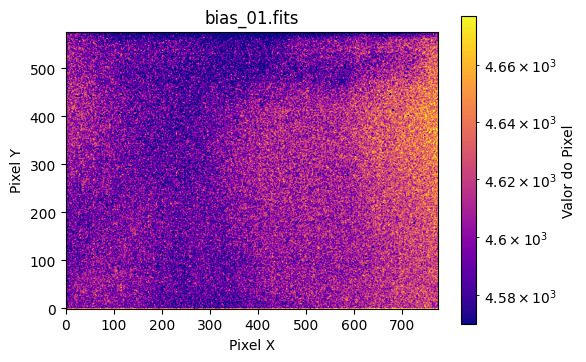

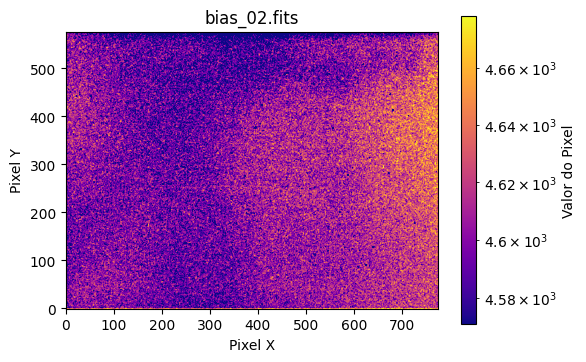

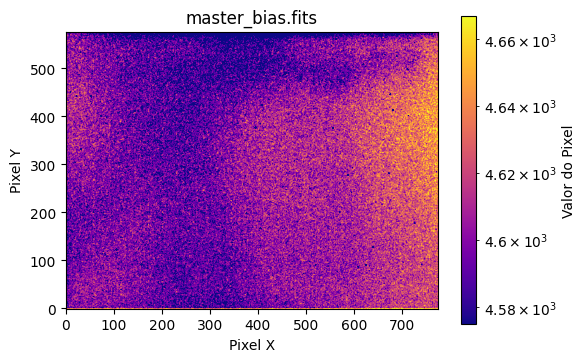

In [208]:
#plota separado #PLOTAR TODOS OS BIAS E MASTERBIAS
# Lista de arquivos de imagem
image_files = [
    './fits/bias_01.fits',
    './fits/bias_02.fits',
    './fits/master_bias.fits'
]

# Preencher bias_list com os dados de imagem 'bias'
bias_list = []
for fname in image_files:
    with fits.open(fname) as hdulist:
        # Itera sobre todas as extensões no arquivo FITS
        for hdu in hdulist:
            # Verifica se o tipo de imagem é 'bias'
            if 'bias' in hdu.header.get('IMAGETYP', '').lower():
                # Cria um dicionário para os metadados
                meta = hdu.header.copy()  # Copia o cabeçalho para os metadados
                meta['filename'] = os.path.basename(fname)  # Adiciona o nome do arquivo aos metadados
                
                # Cria um objeto CCDData e adiciona à lista
                bias_list.append(CCDData(data=hdu.data, meta=meta, unit="adu"))


# Verifica se bias_list não está vazio
if bias_list:
    for i, bias in enumerate(bias_list):
        image_data = bias.data
        filename = bias.meta['filename']  # Nome do arquivo

        # Definir os valores mínimo e máximo para o colormap usando uma escala logarítmica
        vmin, vmax = np.percentile(image_data[image_data > 0], (10, 99.6))  # Ignora valores zero para o logaritmo

        # Plotar a imagem FITS
        plt.figure(figsize=(6, 4))  # Ajuste o tamanho da figura conforme necessário
        im = plt.imshow(image_data, cmap='plasma', origin='lower', norm=colors.LogNorm(vmin=vmin, vmax=vmax))
        plt.title(f"{filename}")  # Apenas o nome do arquivo
        plt.xlabel('Pixel X')
        plt.ylabel('Pixel Y')
        plt.colorbar(label='Valor do Pixel')

        # Mostrar a imagem
        plt.show()
else:
    print("Nenhuma imagem 'bias' encontrada.")

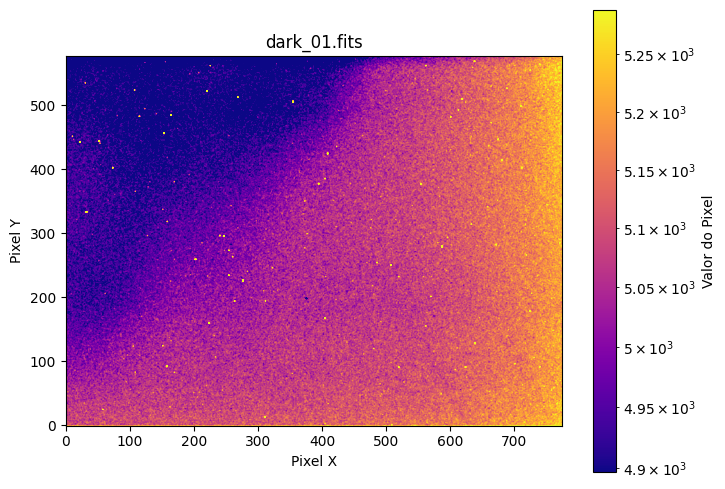

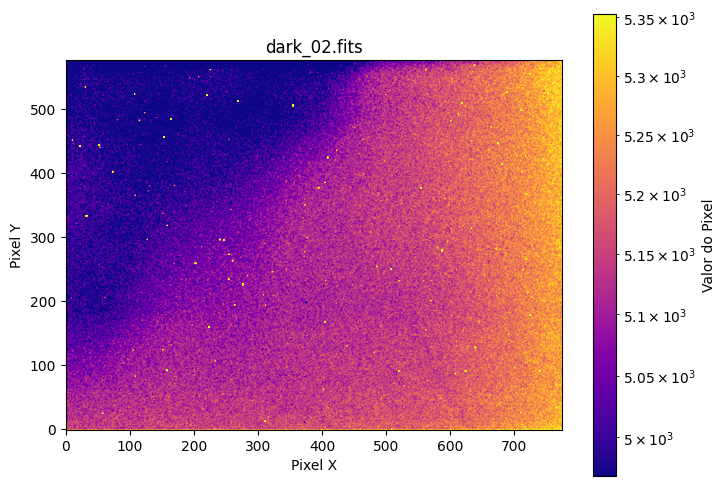

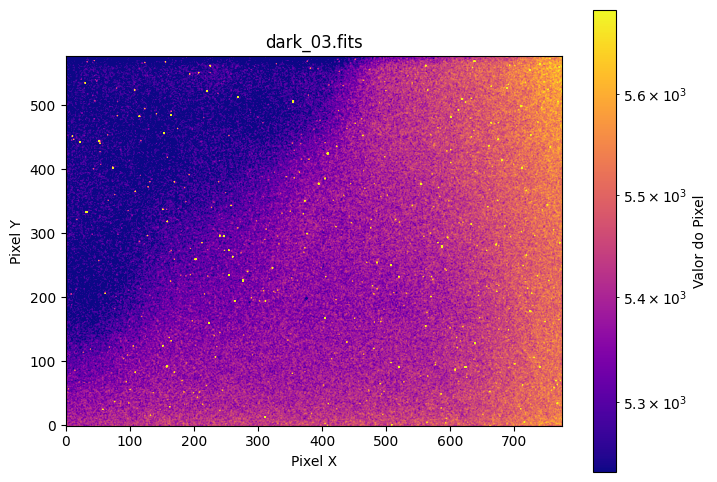

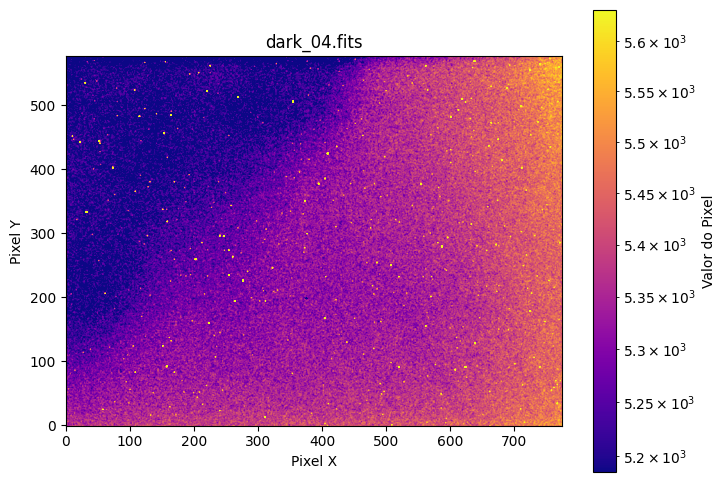

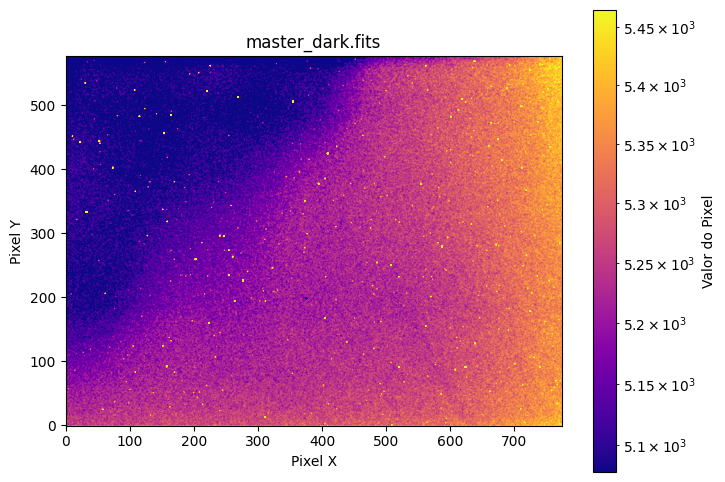

In [209]:
#plota separado darks
# Lista de arquivos de imagem FITS
image_files = [
    './fits/dark_01.fits',
    './fits/dark_02.fits',
    './fits/dark_03.fits',
    './fits/dark_04.fits',
    './fits/master_dark.fits'
]

# Lista para armazenar dados de imagens tipo 'dark'
dark_list = []

# Preencher dark_list com os dados de imagem 'dark'
for fname in image_files:
    with fits.open(fname) as hdulist:
        for hdu in hdulist:
            if 'dark' in hdu.header.get('IMAGETYP', '').lower():
                meta = hdu.header.copy()
                meta['filename'] = os.path.basename(fname)
                dark_list.append(CCDData(data=hdu.data, meta=meta, unit="adu"))

# Verifica se dark_list não está vazio
if dark_list:
    for i, dark in enumerate(dark_list):
        image_data = dark.data
        filename = dark.meta['filename']

        # Definir os valores mínimo e máximo para o colormap usando uma escala logarítmica
        vmin, vmax = np.percentile(image_data[image_data > 0], (10, 99.8))  # Ignora valores zero para logaritmo

        # Plotar a imagem FITS
        plt.figure(figsize=(8, 6))  # Ajuste o tamanho da figura conforme necessário
        im = plt.imshow(image_data, cmap='plasma', origin='lower', norm=colors.LogNorm(vmin=vmin, vmax=vmax))
        plt.title(f"{filename}")  # Apenas o nome do arquivo
        plt.xlabel('Pixel X')
        plt.ylabel('Pixel Y')
        plt.colorbar(label='Valor do Pixel')

        # Mostrar a imagem
        plt.show()
else:
    print("Nenhuma imagem 'dark' encontrada.")

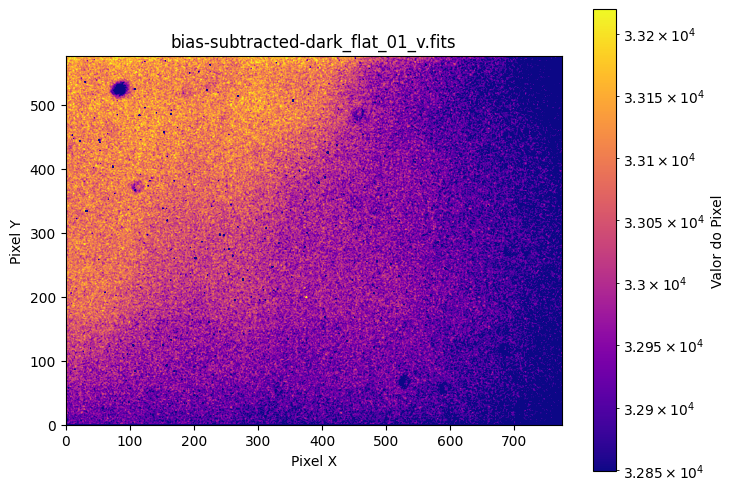

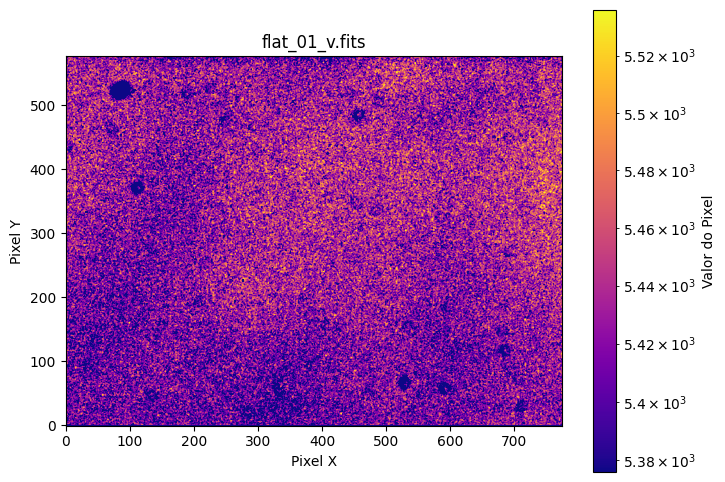

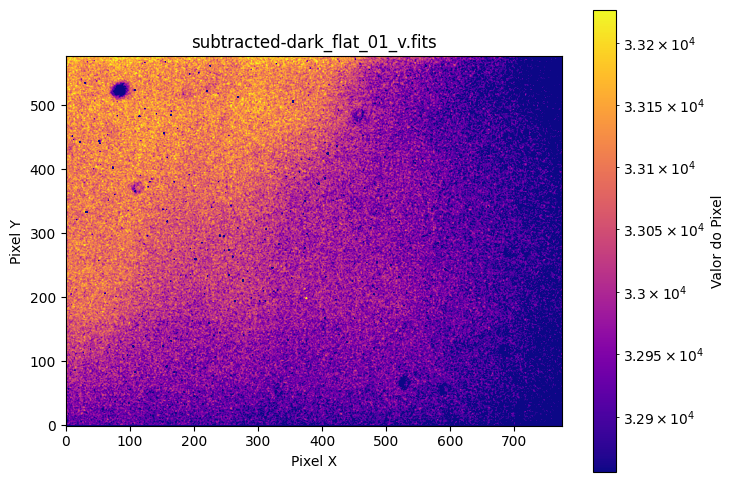

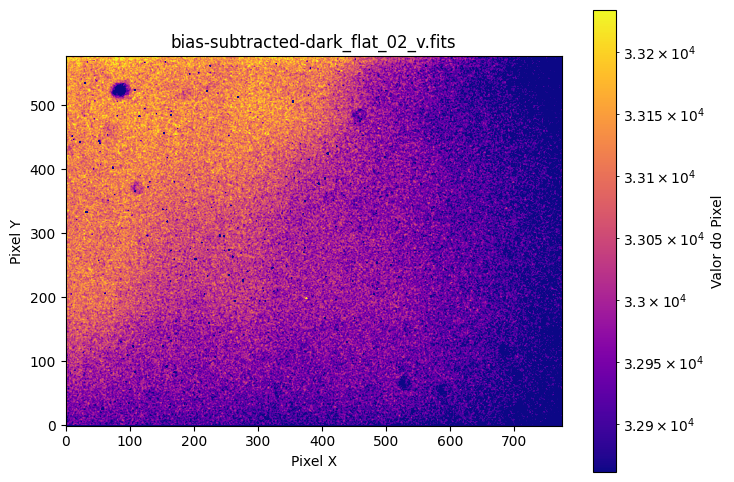

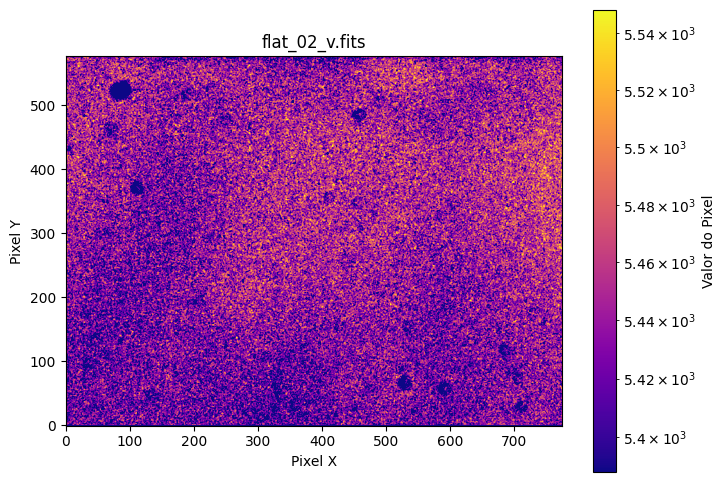

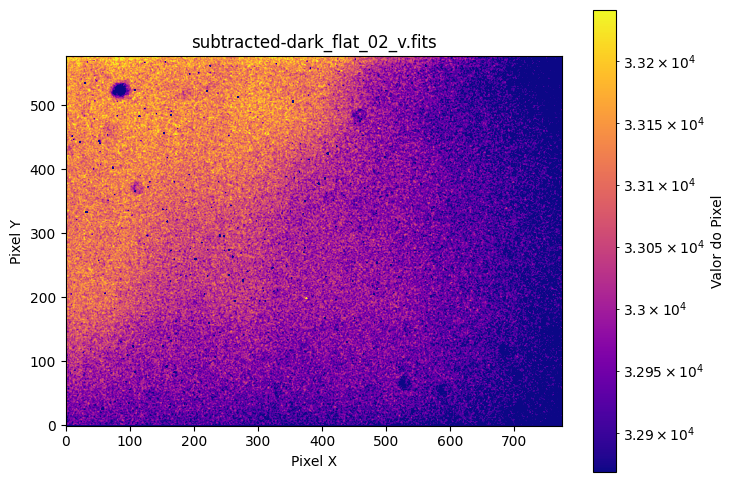

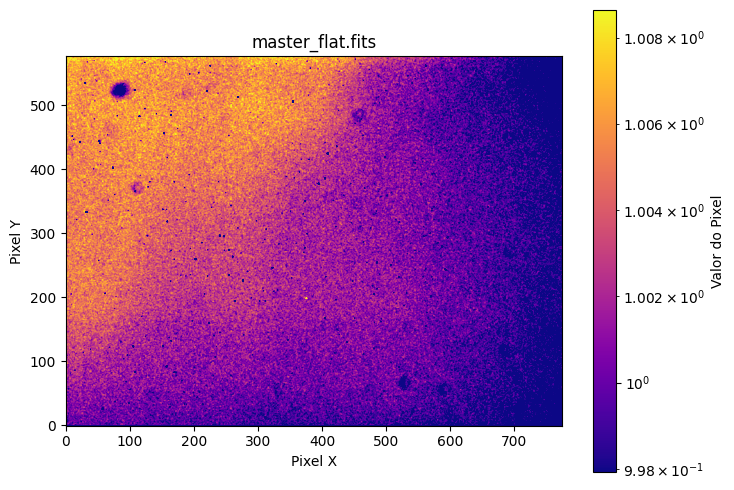

In [210]:
#plota os flats separados
# Diretório contendo os arquivos FITS
fits_directory = './fits/'

# Busca todos os arquivos FITS no diretório
image_files = glob.glob(os.path.join(fits_directory, '*.fits'))

# Lista para armazenar as imagens de flat
flat_list = []

# Itera sobre os arquivos FITS encontrados
for fname in image_files:
    try:
        with fits.open(fname) as hdulist:
            # Itera sobre todas as extensões no arquivo FITS
            for hdu in hdulist:
                # Verifica se o tipo de imagem é 'flat'
                if 'flat' in hdu.header.get('IMAGETYP', '').lower():
                    # Cria um dicionário para os metadados
                    meta = hdu.header.copy()  # Copia o cabeçalho para os metadados
                    # Extrai apenas o nome do arquivo sem o caminho
                    meta['filename'] = os.path.basename(fname)  # Adiciona o nome do arquivo aos metadados
                    
                    # Cria um objeto CCDData e adiciona à lista
                    flat_list.append(CCDData(data=hdu.data, meta=meta, unit="adu"))
    except Exception as e:
        print(f"An error occurred with file {fname}: {e}")

# Verifica se flat_list não está vazio
if flat_list:
    for i, flat_data in enumerate(flat_list):
        try:
            # Obter os dados da imagem
            image_data = flat_data.data
            
            # Definir os valores mínimo e máximo para o colormap usando uma escala logarítmica
            image_data_nonzero = image_data[image_data > 0]
            vmin, vmax = np.percentile(image_data_nonzero, (10, 99.8))  # Ignora valores zero para logaritmo
            
            # Extrair apenas o nome do arquivo dos metadados
            file_name = flat_data.meta.get('filename', 'unknown')
            
            # Plotar a imagem FITS
            plt.figure(figsize=(8, 6))  # Ajuste o tamanho da figura conforme necessário
            im = plt.imshow(image_data, cmap='plasma', origin='lower', norm=colors.LogNorm(vmin=vmin, vmax=vmax))
            plt.title(f'{file_name}')  # Apenas o nome do arquivo
            plt.xlabel('Pixel X')
            plt.ylabel('Pixel Y')
            plt.colorbar(label='Valor do Pixel')

            # Mostrar a imagem
            plt.show()
        
        except Exception as e:
            print(f"An error occurred with file {flat_data.meta.get('filename', 'unknown')}: {e}")
else:
    print("Nenhuma imagem 'flat' encontrada.")

In [190]:
#FAZER FLAT - MASTER_DARK
# Caminho para o arquivo FITS de referência
dark_file = './fits/master_dark.fits'

# Lista de arquivos de imagem FITS
image_files = [
    './fits/flat_01_v.fits', 
    './fits/flat_02_v.fits'
]

# Lista para armazenar caminhos dos arquivos FITS com imagens de tipo 'flat'
flat_list = []

# Coleta arquivos FITS com imagens do tipo 'flat'
for fname in image_files:
    with fits.open(fname) as hdulist:
        # Itera sobre todas as extensões no arquivo FITS
        for hdu in hdulist:
            # Verifica se o tipo de imagem é 'flat'
            if 'flat' in hdu.header.get('IMAGETYP', '').lower():
                # Adiciona o caminho do arquivo à lista
                flat_list.append(fname)

# Abre o arquivo de referência (master_dark.fits)
with fits.open(dark_file) as dark_hdu:
    dark_data = dark_hdu[0].data  # Supondo que os dados estão na extensão 0

# Diretório de saída
output_directory = './fits'

# Itera sobre a lista de imagens flat e realiza a subtração
for flat_file in flat_list:
    with fits.open(flat_file) as flat_hdu:
        flat_data = flat_hdu[0].data  # Supondo que os dados estão na extensão 0
        flat_header = flat_hdu[0].header
        
        # Verifica se os dados do arquivo de referência e o flat têm o mesmo formato
        if dark_data.shape != flat_data.shape:
            raise ValueError(f"Shape mismatch: dark file shape {dark_data.shape} vs flat file shape {flat_data.shape}")
        
        # Subtrai os dados do arquivo de referência dos dados do flat
        result_data = flat_data - dark_data
        
        # Cria um novo HDU com os dados resultantes
        result_hdu = fits.PrimaryHDU(result_data)
        result_header = flat_header.copy()
        result_header['COMMENT'] = 'Subtracted master dark from flat image'
        
        # Atualiza o cabeçalho com os metadados originais
        result_hdu.header.update(result_header)
        
        # Define o nome do arquivo de saída
        output_filename = f"subtracted-dark_{os.path.basename(flat_file)}"
        
        # Cria o caminho completo para o arquivo de saída
        output_path = os.path.join(output_directory, output_filename)
        
        # Salva o arquivo FITS resultante
        result_hdu.writeto(output_path, overwrite=True)
        
        print(f"Saved subtracted image to: {output_path}")

print("Subtraction completed for all flat images.")

Saved subtracted image to: ./fits/subtracted-dark_flat_01_v.fits
Saved subtracted image to: ./fits/subtracted-dark_flat_02_v.fits
Subtraction completed for all flat images.


In [191]:
#testar dimensão da imagem MASTER DARK
from astropy.io import fits

with fits.open(dark_file) as hdulist:
    for i, hdu in enumerate(hdulist):
        print(f"Extension {i}: {hdu.name}")
        print(hdu.header)

Extension 0: PRIMARY
SIMPLE  =                    T / conforms to FITS standard                      BITPIX  =                  -64 / array data type                                NAXIS   =                    2 / number of array dimensions                     NAXIS1  =                  775                                                  NAXIS2  =                  577                                                  EXTEND  =                    T                                                  COMMENT   FITS (Flexible Image Transport System) format is defined in 'AstronomyCOMMENT   and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H EXPOSURE=                  15. / Exposure time in seconds                       DATE    = '2023-02-20T01:30:48.456' / file creation time, UTC                   DATE-OBS= '2023-02-20T01:30:28.032' / Image capture start time, UTC             CREATOR = 'PHD2 Guiding 2.6.11' / Capture software                              PHDPROFI= 'matheusa

In [192]:
#testar dimensão da imagem MASTER BIAS
from astropy.io import fits

# Caminho para o arquivo FITS de referência
master_bias = './fits/master_bias.fits'

# Abre o arquivo FITS de referência
with fits.open(master_bias) as bias_hdu:
    for i, hdu in enumerate(bias_hdu):
        print(f"Master Bias - Extension {i}: {hdu.name}")
        print(hdu.header)

Master Bias - Extension 0: PRIMARY
SIMPLE  =                    T / conforms to FITS standard                      BITPIX  =                  -64 / array data type                                NAXIS   =                    2 / number of array dimensions                     NAXIS1  =                  775                                                  NAXIS2  =                  577                                                  EXTEND  =                    T                                                  COMMENT   FITS (Flexible Image Transport System) format is defined in 'AstronomyCOMMENT   and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H EXPOSURE=                  0.1 / Exposure time in seconds                       DATE    = '2023-02-20T01:28:44.819' / file creation time, UTC                   DATE-OBS= '2023-02-20T01:28:43.130' / Image capture start time, UTC             CREATOR = 'PHD2 Guiding 2.6.11' / Capture software                              PHDPR

In [193]:
#testar dimensão das imagens FLAT - DARK

# Lista de arquivos FITS
flat_subtracted_dark_files = [
    './fits/subtracted-dark_flat_01_v.fits', 
    './fits/subtracted-dark_flat_02_v.fits'
]

# Itera sobre os arquivos e imprime suas extensões
for flat_file in flat_subtracted_dark_files:
    with fits.open(flat_file) as flat_hdu:
        for i, hdu in enumerate(flat_hdu):
            print(f"{os.path.basename(flat_file)} - Extension {i}: {hdu.name}")
            print(hdu.header)

subtracted-dark_flat_01_v.fits - Extension 0: PRIMARY
SIMPLE  =                    T / file does conform to FITS standard             BITPIX  =                  -64 / number of bits per data pixel                  NAXIS   =                    2 / number of data axes                            NAXIS1  =                  775 / length of data axis 1                          NAXIS2  =                  577 / length of data axis 2                          EXTEND  =                    T / FITS dataset may contain extensions            BSCALE  =                    1 / default scaling factor                         BZERO   =                32768 / offset data range to that of unsigned short    EXPOSURE=                  0.1 / Exposure time in seconds                       DATE    = '2023-02-20T03:04:52.876' / file creation time, UTC                   DATE-OBS= '2023-02-20T03:04:50.081' / Image capture start time, UTC             CREATOR = 'PHD2 Guiding 2.6.11' / Capture software                

In [194]:
#FAZER (FLAT - DARK) - BIAS

# Caminho para o arquivo FITS de referência
master_bias = './fits/master_bias.fits'

# Lista para armazenar os dados de imagem
flat_subtracted_dark_files = [
    './fits/subtracted-dark_flat_01_v.fits', 
    './fits/subtracted-dark_flat_02_v.fits'
]

# Imprimindo os nomes dos arquivos
for flat_file in flat_subtracted_dark_files:
    filename = os.path.basename(flat_file)
    print(f"Filename: {filename}")

# Abre o arquivo de referência (master_bias.fits)
with fits.open(master_bias) as bias_hdu:
    bias_data = bias_hdu[2].data  # Supondo que os dados estão na extensão 2

# Diretório de saída
output_directory = './fits'

# Itera sobre a lista de imagens flat e realiza a subtração
for flat_file in flat_subtracted_dark_files:
    # Abre o arquivo FITS flat
    with fits.open(flat_file) as flat_hdu:
        flat_data = flat_hdu[0].data  # Supondo que os dados estão na extensão 2
        
        # Verifica se os dados do arquivo de referência e o flat têm o mesmo formato
        if bias_data.shape != flat_data.shape:
            raise ValueError(f"Shape mismatch: bias shape {bias_data.shape} vs flat shape {flat_data.shape}")

        # Subtrai os dados do arquivo de referência dos dados do flat
        result_data = flat_data - bias_data

        # Cria um novo HDU com os dados resultantes
        result_hdu = fits.PrimaryHDU(result_data)
        result_header = flat_hdu[0].header  # Usando o cabeçalho do flat extensão 0
        result_hdu.header.update(result_header)  # Atualiza o cabeçalho com metadados originais

        # Define o nome do arquivo de saída
        output_filename = f"bias-{os.path.basename(flat_file)}"

        # Cria o caminho completo para o arquivo de saída
        output_path = os.path.join(output_directory, output_filename)

        # Salva o arquivo FITS resultante
        result_hdu.writeto(output_path, overwrite=True)

        print(f"Saved subtracted image to: {output_path}")

print("Subtraction completed for all flat images.")

Filename: subtracted-dark_flat_01_v.fits
Filename: subtracted-dark_flat_02_v.fits
Saved subtracted image to: ./fits/bias-subtracted-dark_flat_01_v.fits
Saved subtracted image to: ./fits/bias-subtracted-dark_flat_02_v.fits
Subtraction completed for all flat images.


In [195]:
#FAZER MASTER FLAT
# Lista dos arquivos FITS com dados subtraídos
flat_subtracted_full_list = [
    './fits/bias-subtracted-dark_flat_01_v.fits', 
    './fits/bias-subtracted-dark_flat_02_v.fits'
]

# Função para calcular e normalizar pelo modo
def normalize_by_mode(ccd):
    mode = stats.mode(ccd.data, axis=None, keepdims=False)[0]
    return CCDData(ccd.data / mode, unit='adu', meta=ccd.meta)

# Carrega e normaliza as imagens FITS
ccd_list = [normalize_by_mode(CCDData.read(file, unit='adu')) for file in flat_subtracted_full_list]

# Combina as imagens normalizadas usando o método 'median' com sigma clipping
master_flat = ccdp.combine(
    ccd_list,
    method='median',
    sigma_clip=True,
    sigma_clip_low_thresh=5,
    sigma_clip_high_thresh=5,
    sigma_clip_func=np.ma.median,
    sigma_clip_dev_func=mad_std,
    mem_limit=350e6
)

# Adiciona uma nova chave ao cabeçalho para indicar que a combinação foi feita
master_flat.meta['combined'] = True

# Salva o arquivo FITS resultante
master_flat.write('./fits/master_flat.fits', overwrite=True)

print("Master flat image saved successfully.")

Master flat image saved successfully.


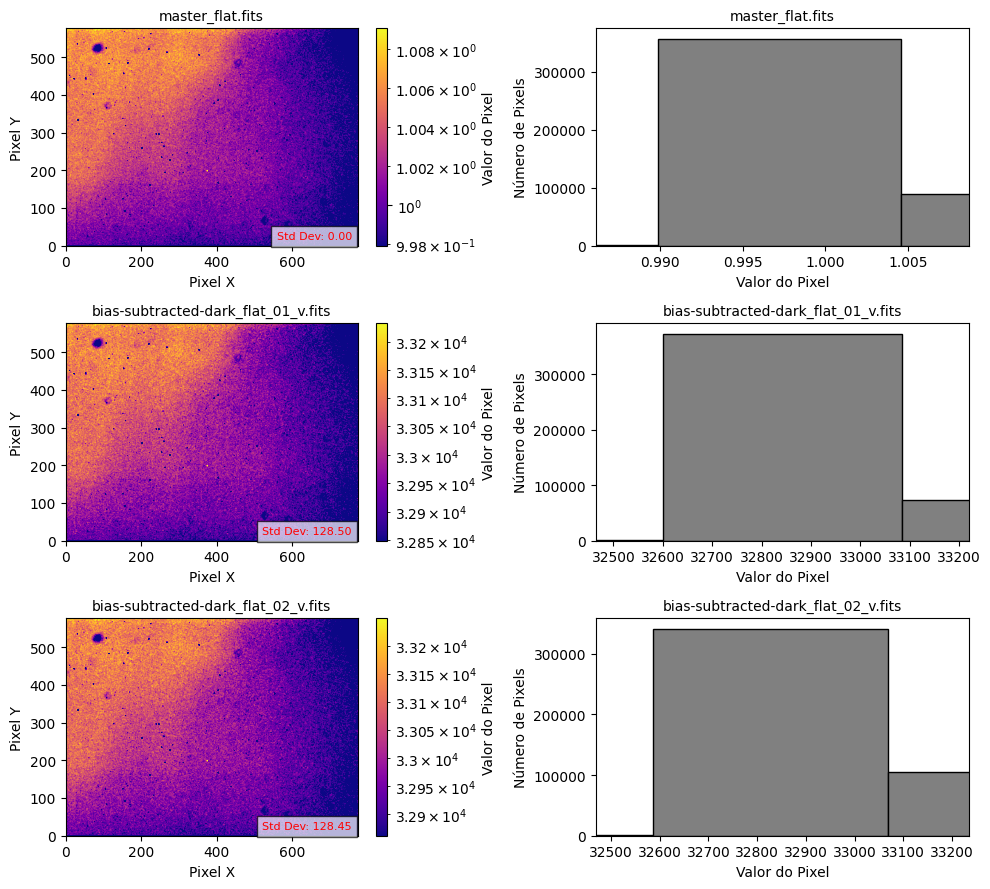

In [211]:
#PLOTA FLATS

# Lista de caminhos dos arquivos FITS
files_to_access = [
    './fits/master_flat.fits',
    './fits/bias-subtracted-dark_flat_01_v.fits',
    './fits/bias-subtracted-dark_flat_02_v.fits'
]

# Configurar a figura para múltiplos subplots (imagem e histograma lado a lado)
num_files = len(files_to_access)
fig, axes = plt.subplots(num_files, 2, figsize=(10, 3 * num_files))  # Ajuste de tamanho

# Verificar se há apenas um subplot para ajustar a estrutura
if num_files == 1:
    axes = np.array([axes])

# Loop através dos arquivos FITS
for i, file_path in enumerate(files_to_access):
    try:
        # Ler os dados da imagem FITS
        with fits.open(file_path) as hdul:
            image_data = CCDData(hdul[0].data, meta=hdul[0].header, unit='adu').data

        # Calcular o desvio padrão
        std_dev = np.std(image_data)

        # Definir os valores mínimo e máximo para o colormap usando uma escala logarítmica
        image_data_nonzero = image_data[image_data > 0]  # Ignora valores zero para o cálculo de percentis
        vmin, vmax = np.percentile(image_data_nonzero, (10, 99.9))  # Ajusta os percentis conforme necessário

        # Extrair apenas o nome do arquivo sem o caminho
        file_name = os.path.basename(file_path)

        # Plotar a imagem FITS
        ax_img = axes[i, 0]
        im = ax_img.imshow(image_data, cmap='plasma', origin='lower', norm=colors.LogNorm(vmin=vmin, vmax=vmax))
        ax_img.set_title(f'{file_name}', fontsize=10)  # Nome do arquivo em fonte menor
        ax_img.set_xlabel('Pixel X')
        ax_img.set_ylabel('Pixel Y')
        ax_img.axis('on')
        cbar = plt.colorbar(im, ax=ax_img)
        cbar.set_label('Valor do Pixel')

        # Adicionar o desvio padrão como anotação na imagem
        ax_img.text(0.98, 0.02, f'Std Dev: {std_dev:.2f}', color='red', 
                    fontsize=8, ha='right', va='bottom', 
                    transform=ax_img.transAxes, bbox=dict(facecolor='white', alpha=0.7))

        # Plotar o histograma
        ax_hist = axes[i, 1]
        pixel_values = image_data.flatten()

        # Calcular os limites dos dados para o histograma
        min_val = np.percentile(pixel_values, 0.1)  # Excluir valores extremos muito baixos
        max_val = np.percentile(pixel_values, 99.8)  # Excluir valores extremos muito altos

        # Ajustar os limites do histograma para mostrar apenas a área com dados
        ax_hist.hist(pixel_values, bins=20, color='gray', edgecolor='black')
        ax_hist.set_xlim(min_val, max_val)  # Limita os eixos x ao intervalo de dados
        ax_hist.set_title(f'{file_name}', fontsize=10)  # Nome do arquivo em fonte menor
        ax_hist.set_xlabel('Valor do Pixel')
        ax_hist.set_ylabel('Número de Pixels')

    except Exception as e:
        print(f"An error occurred with file {file_path}: {e}")

# Ajustar o layout da figura
plt.tight_layout()
plt.show()

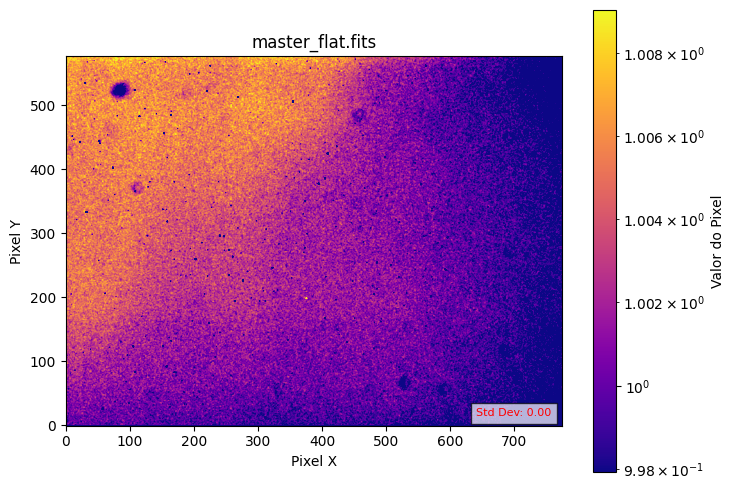

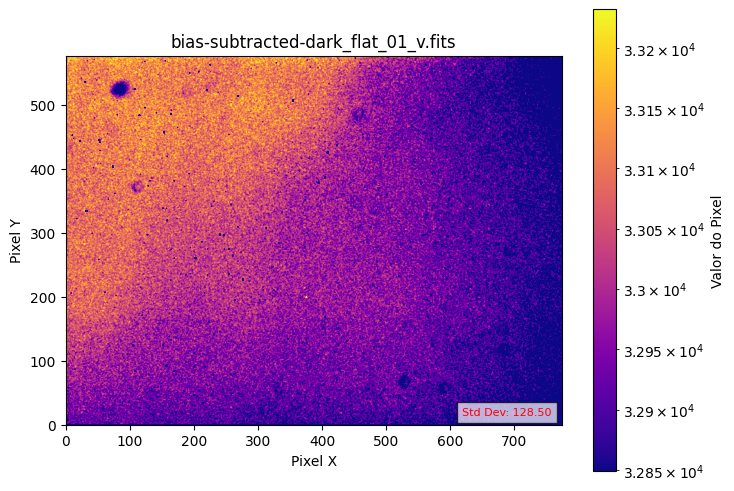

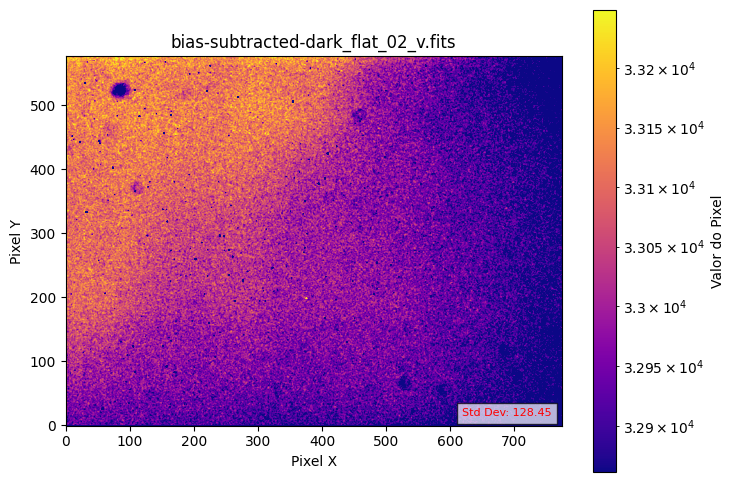

In [197]:
# Lista de caminhos dos arquivos FITS
files_to_access = [
    './fits/master_flat.fits',
    './fits/bias-subtracted-dark_flat_01_v.fits',
    './fits/bias-subtracted-dark_flat_02_v.fits'
]

# Loop através dos arquivos FITS
for file_path in files_to_access:
    try:
        # Ler os dados da imagem FITS
        with fits.open(file_path) as hdul:
            image_data = CCDData(hdul[0].data, meta=hdul[0].header, unit='adu').data

        # Definir os valores mínimo e máximo para o colormap usando uma escala logarítmica
        image_data_nonzero = image_data[image_data > 0]  # Ignora valores zero para o cálculo de percentis
        vmin, vmax = np.percentile(image_data_nonzero, (10, 99.9))  # Ajusta os percentis conforme necessário

        # Extrair apenas o nome do arquivo sem o caminho
        file_name = os.path.basename(file_path)

        # Plotar a imagem FITS
        plt.figure(figsize=(8, 6))  # Ajuste o tamanho da figura conforme necessário
        im = plt.imshow(image_data, cmap='plasma', origin='lower', norm=colors.LogNorm(vmin=vmin, vmax=vmax))
        plt.title(f'{file_name}')  # Nome do arquivo em fonte menor
        plt.xlabel('Pixel X')
        plt.ylabel('Pixel Y')
        plt.colorbar(label='Valor do Pixel')

        # Adicionar o desvio padrão como anotação na imagem
        std_dev = np.std(image_data)
        plt.text(0.98, 0.02, f'Std Dev: {std_dev:.2f}', color='red', 
                 fontsize=8, ha='right', va='bottom', 
                 transform=plt.gca().transAxes, bbox=dict(facecolor='white', alpha=0.7))

        # Mostrar a imagem
        plt.show()
    
    except Exception as e:
        print(f"An error occurred with file {file_path}: {e}")

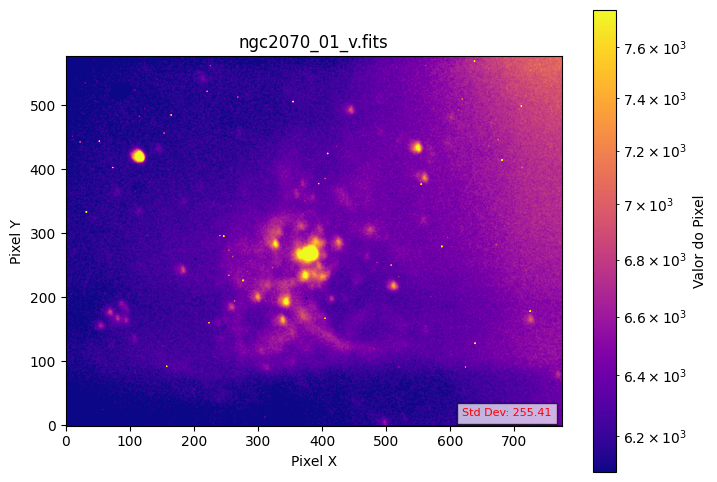

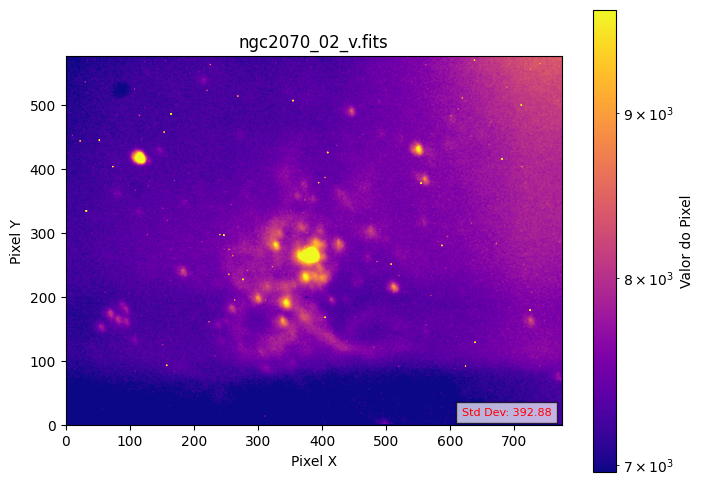

In [198]:
# Listar os caminhos dos arquivos FITS
file_paths = [
    './fits/ngc2070_01_v.fits',
    './fits/ngc2070_02_v.fits'
]

# Diretório para salvar as imagens
output_dir = './output_images'
os.makedirs(output_dir, exist_ok=True)

# Loop através dos arquivos FITS
for file_path in file_paths:
    try:
        # Ler os dados da imagem FITS
        with fits.open(file_path) as hdul:
            image_data = CCDData(hdul[0].data, meta=hdul[0].header, unit='adu').data

        # Calcular o desvio padrão
        std_dev = np.std(image_data)

        # Definir os valores mínimo e máximo para o colormap
        vmin, vmax = np.percentile(image_data, (8, 99.8))  # Ajusta os percentis conforme necessário

        # Extrair apenas o nome do arquivo sem o caminho
        file_name = os.path.basename(file_path)


        # Plotar a imagem FITS
        plt.figure(figsize=(8, 6))  # Ajuste de tamanho

        # Mostrar a imagem
        plt.imshow(image_data, cmap='plasma', origin='lower', norm=colors.LogNorm(vmin=vmin, vmax=vmax))
        plt.title(f'{file_name}', fontsize=12)  # Nome do arquivo em fonte menor
        plt.xlabel('Pixel X')
        plt.ylabel('Pixel Y')
        plt.colorbar(label='Valor do Pixel')

        # Adicionar o desvio padrão como anotação na imagem
        plt.text(0.98, 0.02, f'Std Dev: {std_dev:.2f}', color='red', 
                 fontsize=8, ha='right', va='bottom', 
                 transform=plt.gca().transAxes, bbox=dict(facecolor='white', alpha=0.7))


    except Exception as e:
        print(f"An error occurred with file {file_path}: {e}")


In [199]:
#testar dimensão da imagem MASTER DARK 
from astropy.io import fits

# Caminho para o arquivo FITS de referência
master_bias = './fits/master_dark.fits'

# Abre o arquivo FITS de referência
with fits.open(master_bias) as bias_hdu:
    for i, hdu in enumerate(bias_hdu):
        print(f"Master Bias - Extension {i}: {hdu.name}")
        print(hdu.header)

Master Bias - Extension 0: PRIMARY
SIMPLE  =                    T / conforms to FITS standard                      BITPIX  =                  -64 / array data type                                NAXIS   =                    2 / number of array dimensions                     NAXIS1  =                  775                                                  NAXIS2  =                  577                                                  EXTEND  =                    T                                                  COMMENT   FITS (Flexible Image Transport System) format is defined in 'AstronomyCOMMENT   and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H EXPOSURE=                  15. / Exposure time in seconds                       DATE    = '2023-02-20T01:30:48.456' / file creation time, UTC                   DATE-OBS= '2023-02-20T01:30:28.032' / Image capture start time, UTC             CREATOR = 'PHD2 Guiding 2.6.11' / Capture software                              PHDPR

In [200]:
# fazer LIGHT - DARK

# Caminho para o arquivo FITS de referência
dark_file = './fits/master_dark.fits'

# Lista para armazenar os dados de imagem
image_files = [
    './fits/ngc2070_01_v.fits',
    './fits/ngc2070_02_v.fits'
]


# Itera sobre os arquivos encontrados
for fname in image_files:
    with fits.open(fname) as hdulist:
        # Itera sobre todas as extensões no arquivo FITS
        for hdu in hdulist:
            # Verifica se o tipo de imagem é 'light'
            if 'light' in hdu.header.get('IMAGETYP', '').lower():
                # Cria um dicionário para os metadados
                meta = hdu.header.copy()  # Copia o cabeçalho para os metadados
                meta['filename'] = fname  # Adiciona o nome do arquivo aos metadados
                
                # Cria um objeto CCDData e adiciona à lista
                light_list.append(CCDData(data=hdu.data, meta=meta, unit="adu"))

# Exibe a lista de arquivos light encontrados
for light in light_list:
    print(f"Filename: {light.meta['filename']}")

# Abre o arquivo de referência (combined_dark.fits)
with fits.open(dark_file) as dark_hdu:
    dark_data = dark_hdu[2].data  # Supondo que os dados estão na extensão 1

# Diretório de saída
output_directory = './fits/'

# Itera sobre a lista de imagens light e realiza a subtração
for light in light_list:
    # Verifica se os dados do arquivo de referência e o light têm o mesmo formato
    if dark_data.shape != light.data.shape:
        raise ValueError(f"Shape mismatch: dark file shape {dark_data.shape} vs light file shape {light.data.shape}")

    # Subtrai os dados do arquivo de referência dos dados do light
    result_data = light.data - dark_data

    # Cria um novo HDU com os dados resultantes
    result_hdu = fits.PrimaryHDU(result_data)
    result_header = light.meta
    result_hdu.header.update(result_header)  # Atualiza o cabeçalho com metadados originais

    # Define o nome do arquivo de saída
    output_filename = f"subtracted-dark_{os.path.basename(light.meta['filename'])}"

    # Cria o caminho completo para o arquivo de saída
    output_path = os.path.join(output_directory, output_filename)

    # Salva o arquivo FITS resultante
    result_hdu.writeto(output_path, overwrite=True)

    print(f"Saved subtracted image to: {output_path}")

print("Subtraction completed for all light images.")

Filename: ./fits/ngc2070_01_v.fits
Filename: ./fits/ngc2070_02_v.fits
Filename: ./fits/ngc2070_01_v.fits
Filename: ./fits/ngc2070_02_v.fits
Saved subtracted image to: ./fits/subtracted-dark_ngc2070_01_v.fits
Saved subtracted image to: ./fits/subtracted-dark_ngc2070_02_v.fits
Saved subtracted image to: ./fits/subtracted-dark_ngc2070_01_v.fits
Saved subtracted image to: ./fits/subtracted-dark_ngc2070_02_v.fits
Subtraction completed for all light images.


In [201]:
# FAZER (LIGHT - DARK ) - BIAS

# Caminho para o arquivo FITS de referência
master_bias = './fits/master_bias.fits'

# Lista para armazenar os arquivos subtraídos do dark
light_subtracted_dark_files = [
    './fits/subtracted-dark_ngc2070_01_v.fits', 
    './fits/subtracted-dark_ngc2070_02_v.fits',
]

# Imprimindo os nomes dos arquivos
for light_file in light_subtracted_dark_files:
    filename = os.path.basename(light_file)
    print(f"Filename: {filename}")

# Abre o arquivo de referência (master_bias.fits)
with fits.open(master_bias) as bias_hdu:
    bias_data = bias_hdu[2].data  # Supondo que os dados estão na extensão 0

# Diretório de saída
output_directory = './fits/'

# Itera sobre a lista de imagens light e realiza a subtração
for light_file in light_subtracted_dark_files:
    # Abre o arquivo FITS light subtraído do dark
    with fits.open(light_file) as light_hdu:
        light_data = light_hdu[0].data  # Supondo que os dados estão na extensão 0
        
        # Verifica se os dados do arquivo de referência e o light têm o mesmo formato
        if bias_data.shape != light_data.shape:
            raise ValueError(f"Shape mismatch: bias shape {bias_data.shape} vs light shape {light_data.shape}")

        # Subtrai os dados do arquivo de referência dos dados do light
        result_data = light_data - bias_data

        # Cria um novo HDU com os dados resultantes
        result_hdu = fits.PrimaryHDU(result_data)
        result_header = light_hdu[0].header  # Usando o cabeçalho do light
        result_hdu.header.update(result_header)  # Atualiza o cabeçalho com metadados originais

        # Define o nome do arquivo de saída
        output_filename = f"bias-{os.path.basename(light_file)}"

        # Cria o caminho completo para o arquivo de saída
        output_path = os.path.join(output_directory, output_filename)

        # Salva o arquivo FITS resultante
        result_hdu.writeto(output_path, overwrite=True)

        print(f"Saved subtracted image to: {output_path}")

print("Subtraction completed for all light images.")

Filename: subtracted-dark_ngc2070_01_v.fits
Filename: subtracted-dark_ngc2070_02_v.fits
Saved subtracted image to: ./fits/bias-subtracted-dark_ngc2070_01_v.fits
Saved subtracted image to: ./fits/bias-subtracted-dark_ngc2070_02_v.fits
Subtraction completed for all light images.


In [202]:
#testar dimensão do MASTER FLAT

import os
from astropy.io import fits

# Lista de arquivos FITS
flat_subtracted_dark_files = [
    './fits/master_flat.fits'
]

# Itera sobre os arquivos e imprime suas extensões
for flat_file in flat_subtracted_dark_files:
    with fits.open(flat_file) as flat_hdu:
        for i, hdu in enumerate(flat_hdu):
            print(f"{os.path.basename(flat_file)} - Extension {i}: {hdu.name}")
            print(hdu.header)

master_flat.fits - Extension 0: PRIMARY
SIMPLE  =                    T / conforms to FITS standard                      BITPIX  =                  -64 / array data type                                NAXIS   =                    2 / number of array dimensions                     NAXIS1  =                  775                                                  NAXIS2  =                  577                                                  EXTEND  =                    T                                                  EXPOSURE=                  0.1 / Exposure time in seconds                       DATE    = '2023-02-20T03:04:52.876' / file creation time, UTC                   DATE-OBS= '2023-02-20T03:04:50.081' / Image capture start time, UTC             CREATOR = 'PHD2 Guiding 2.6.11' / Capture software                              PHDPROFI= 'matheusastro'       / PHD2 Equipment Profile                         INSTRUME= 'Meade DSI'          / Instrument name                                

Filename: ./fits/bias-subtracted-dark_ngc2070_01_v.fits
Filename: ./fits/bias-subtracted-dark_ngc2070_02_v.fits
Saved divided image to: ./fits/flat-divided-bias-subtracted-dark_ngc2070_01_v.fits
Saved divided image to: ./fits/flat-divided-bias-subtracted-dark_ngc2070_02_v.fits


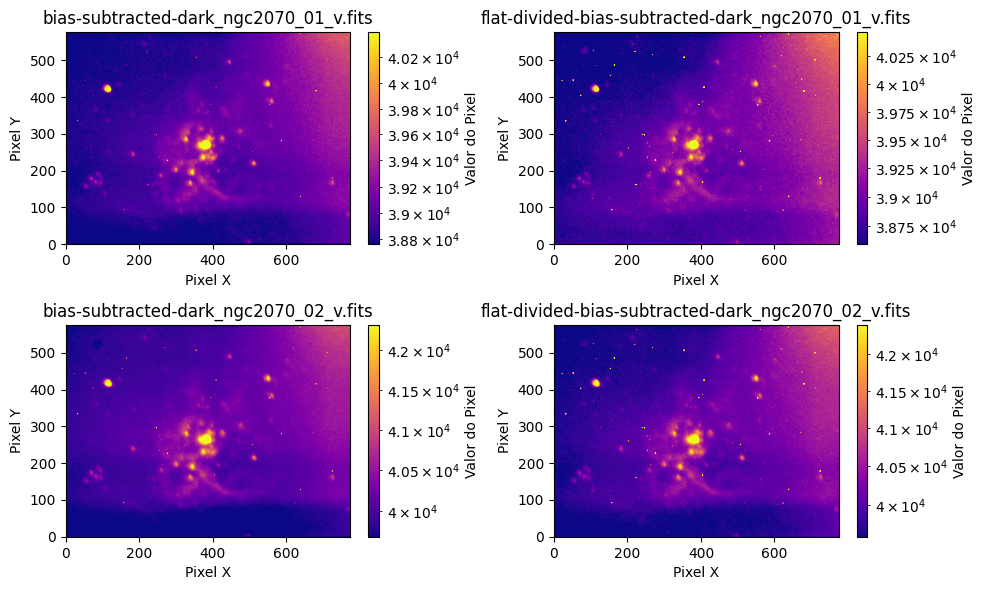

All processed images have been saved to the following paths:
./fits/flat-divided-bias-subtracted-dark_ngc2070_01_v.fits
./fits/flat-divided-bias-subtracted-dark_ngc2070_02_v.fits
Division completed for all light images.


In [212]:
#PRINTA IMAGEM CORRIGIDA     LIGHT/FLATNORM


# Lista de arquivos light
light_files = [
    './fits/bias-subtracted-dark_ngc2070_01_v.fits',
    './fits/bias-subtracted-dark_ngc2070_02_v.fits'
]

# Caminho para o arquivo FITS de referência
flat_file = './fits/master_flat.fits'

# Lista para armazenar CCDData
ccd_list = []

# Itera sobre os arquivos light fornecidos
for fname in light_files:
    with fits.open(fname) as hdulist:
        # Itera sobre todas as extensões no arquivo FITS
        for hdu in hdulist:
            # Verifica se o tipo de imagem é 'light'
            if 'light' in hdu.header.get('IMAGETYP', '').lower():
                # Cria um dicionário para os metadados
                meta = hdu.header.copy()  # Copia o cabeçalho para os metadados
                meta['filename'] = fname  # Adiciona o nome do arquivo aos metadados
                
                # Cria um objeto CCDData e adiciona à lista
                ccd_list.append(CCDData(data=hdu.data, meta=meta, unit="adu"))

# Exibe a lista de arquivos light encontrados
for light in ccd_list:
    print(f"Filename: {light.meta['filename']}")

# Abre o arquivo de referência (master_flat.fits)
with fits.open(flat_file) as flat_hdu:
    flat_data = flat_hdu[0].data  # Supondo que os dados estão na extensão principal

# Define um valor pequeno para substituir zeros
epsilon = 1e-10

# Substitui zeros no flat_data por epsilon
flat_data = np.where(flat_data == 0, epsilon, flat_data)

# Diretório de saída
output_directory = './fits/'

# Lista para armazenar caminhos dos arquivos salvos
saved_files = []

# Configura a figura para exibir os gráficos lado a lado
fig, axes = plt.subplots(nrows=len(ccd_list), ncols=2, figsize=(10, 3 * len(ccd_list)))
if len(ccd_list) == 1:
    axes = [axes]  # Garante que axes é uma lista se houver apenas um subplot

for i, light in enumerate(ccd_list):
    # Verifica se os dados do arquivo de referência e o light têm o mesmo formato
    if flat_data.shape != light.data.shape:
        raise ValueError(f"Shape mismatch: flat file shape {flat_data.shape} vs light file shape {light.data.shape}")

    # Divide os dados do light pelos dados do flat
    result_data = light.data / flat_data

    # Substitui valores infinitos e NaN por zero
    result_data = np.nan_to_num(result_data, nan=0.0, posinf=0.0, neginf=0.0)

    # Cria um novo HDU com os dados resultantes
    result_hdu = fits.PrimaryHDU(result_data)
    result_header = light.meta
    result_hdu.header.update(result_header)  # Atualiza o cabeçalho com metadados originais

    # Define o nome do arquivo de saída
    output_filename = f"flat-divided-{os.path.basename(light.meta['filename'])}"

    # Cria o caminho completo para o arquivo de saída
    output_path = os.path.join(output_directory, output_filename)

    # Salva o arquivo FITS resultante
    result_hdu.writeto(output_path, overwrite=True)

    # Adiciona o caminho do arquivo salvo à lista
    saved_files.append(output_path)

    print(f"Saved divided image to: {output_path}")

    # Plotagem da imagem light original e processada
    # Define valores mínimo e máximo para a escala logarítmica
    vmin_light, vmax_light = np.percentile(light.data[light.data > 0], (10, 99.8))
    vmin_result, vmax_result = np.percentile(result_data[result_data > 0], (10, 99.8))

    im_light = axes[i][0].imshow(light.data, cmap='plasma', origin='lower', 
                                 norm=colors.LogNorm(vmin=vmin_light, vmax=vmax_light))
    axes[i][0].set_title(f"{os.path.basename(light.meta['filename'])}")
    axes[i][0].set_xlabel('Pixel X')
    axes[i][0].set_ylabel('Pixel Y')
    axes[i][0].axis('on')
    cbar_light = plt.colorbar(im_light, ax=axes[i][0])
    cbar_light.set_label('Valor do Pixel')

    im_result = axes[i][1].imshow(result_data, cmap='plasma', origin='lower', 
                                  norm=colors.LogNorm(vmin=vmin_result, vmax=vmax_result))
    axes[i][1].set_title(f"{os.path.basename(output_path)}")
    axes[i][1].set_xlabel('Pixel X')
    axes[i][1].set_ylabel('Pixel Y')
    axes[i][1].axis('on')
    cbar_result = plt.colorbar(im_result, ax=axes[i][1])
    cbar_result.set_label('Valor do Pixel')

# Ajusta o layout para evitar sobreposição
plt.tight_layout()
plt.show()

# Exibe a lista de todos os arquivos salvos
print("All processed images have been saved to the following paths:")
for saved_file in saved_files:
    print(saved_file)

print("Division completed for all light images.")

Informações salvas em: ./fits/flat-divided-bias-subtracted-dark_ngc2070_01_v_stars.txt
Informações salvas em: ./fits/flat-divided-bias-subtracted-dark_ngc2070_02_v_stars.txt


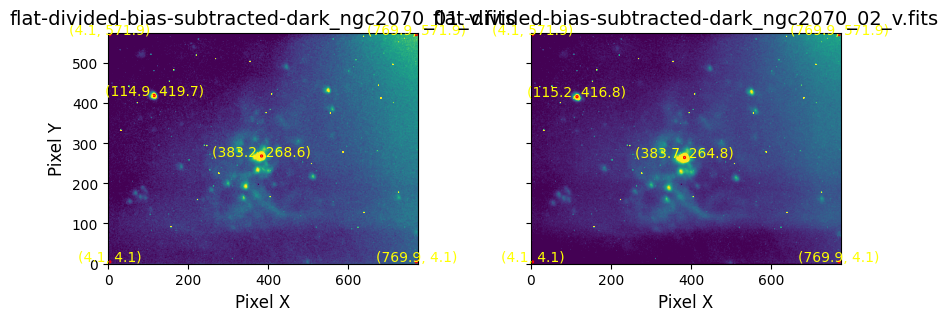

In [204]:
#PEGA AS COORDENADAS DAS ESTRELAS


def process_image(fits_file, fwhm=9.0, threshold_factor=20.0):
    with fits.open(fits_file) as hdulist:
        image_data = hdulist[0].data
    
    # Ajuste do limiar com base na mediana e desvio padrão dos dados
    threshold = threshold_factor * mad_std(image_data)
    daofind = DAOStarFinder(fwhm=fwhm, threshold=threshold)
    sources = daofind(image_data)
    if sources is not None:
        stars_table = Table(sources)
    else:
        stars_table = Table(names=('xcentroid', 'ycentroid', 'peak', 'flux'), dtype=('f8', 'f8', 'f8', 'f8'))
    return image_data, stars_table

def draw_circles(ax, stars_table, fwhm):
    for star in stars_table:
        circle = Circle((star['xcentroid'], star['ycentroid']), fwhm/2, edgecolor='red', facecolor='none', linewidth=1.5)
        ax.add_patch(circle)
        ax.text(star['xcentroid'], star['ycentroid'], f"({star['xcentroid']:.1f}, {star['ycentroid']:.1f})", color='yellow', fontsize=10, ha='center')

def save_stars_table_to_txt(stars_table, fits_file):
    # Obtém o diretório do arquivo FITS e cria o nome do arquivo .txt
    dir_name = os.path.dirname(fits_file)
    base_name = os.path.basename(fits_file).replace('.fits', '_stars.txt')
    txt_file = os.path.join(dir_name, base_name)

    with open(txt_file, 'w') as f:
        f.write('xcentroid\tycentroid\tpeak\tflux\n')
        for star in stars_table:
            f.write(f"{star['xcentroid']:.2f}\t{star['ycentroid']:.2f}\t{star['peak']:.2f}\t{star['flux']:.2f}\n")

    return txt_file

# Caminho para os arquivos FITS
fits_file1 = './fits/flat-divided-bias-subtracted-dark_ngc2070_01_v.fits'
fits_file2 = './fits/flat-divided-bias-subtracted-dark_ngc2070_02_v.fits'

# Processa as imagens para detectar estrelas
image_data_1, stars_table_1 = process_image(fits_file1)
image_data_2, stars_table_2 = process_image(fits_file2)

# Salva as tabelas de estrelas em arquivos .txt
txt_file1 = save_stars_table_to_txt(stars_table_1, fits_file1)
txt_file2 = save_stars_table_to_txt(stars_table_2, fits_file2)

print(f"Informações salvas em: {txt_file1}")
print(f"Informações salvas em: {txt_file2}")

# Configurações de visualização
fig, axs = plt.subplots(1, 2, figsize=(10, 3), sharex=True, sharey=True)

# Define vmin e vmax para a visualização
vmin_1, vmax_1 = np.percentile(image_data_1, (10, 99.8))
vmin_2, vmax_2 = np.percentile(image_data_2, (10, 99.8))

axs[0].imshow(image_data_1, cmap='viridis', origin='lower', vmin=vmin_1, vmax=vmax_1)
draw_circles(axs[0], stars_table_1, fwhm=3.0)
axs[0].set_title(f"{os.path.basename(fits_file1)}", fontsize=14)
axs[0].set_xlabel('Pixel X', fontsize=12)
axs[0].set_ylabel('Pixel Y', fontsize=12)
axs[0].tick_params(axis='both', which='major', labelsize=10)
axs[0].axis('on')

# Plota a imagem 2 e suas coordenadas
axs[1].imshow(image_data_2, cmap='viridis', origin='lower', vmin=vmin_2, vmax=vmax_2)
draw_circles(axs[1], stars_table_2, fwhm=3.0)
axs[1].set_title(f"{os.path.basename(fits_file2)}", fontsize=14)
axs[1].set_xlabel('Pixel X', fontsize=12)
axs[1].tick_params(axis='both', which='major', labelsize=10)
axs[1].axis('on')

plt.show()

Dimensões da imagem original: (577, 775)
Média da imagem original: 40026.1801958978
Dimensões da imagem shiftada: (577, 775)
Imagem shiftada salva em: ./fits/shifted_flat-divided-bias-subtracted-dark_ngc2070_02_v.fits


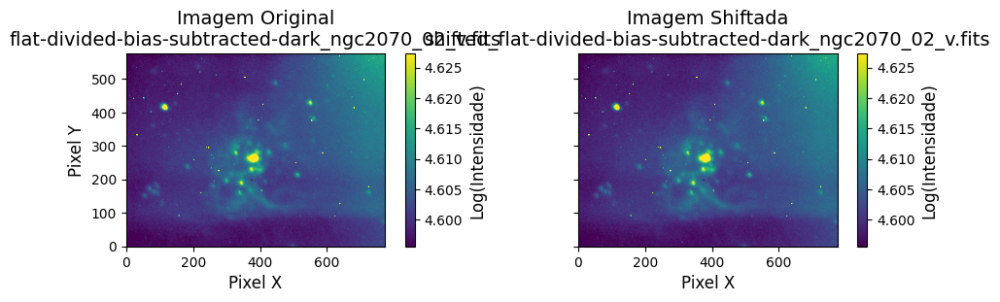

In [205]:
#fazer shift
# Caminho para o arquivo FITS original
fits_file = './fits/flat-divided-bias-subtracted-dark_ngc2070_02_v.fits'

# Caminho para o novo arquivo FITS
shifted_fits_file = './fits/shifted_flat-divided-bias-subtracted-dark_ngc2070_02_v.fits'

# Parâmetros de shift e rotação
x_shift = 0
y_shift = 0
rotation_angle = 0 # Exemplo: 30 graus

# Função para desenhar círculos (placeholder)
def draw_circles(ax, stars_table, fwhm=3.0):
    # Implementar a função se necessário
    pass

# Carregar o arquivo FITS
with fits.open(fits_file) as hdul:
    # Acessar a primeira extensão (imagens geralmente estão na primeira extensão)
    image_data = hdul[0].data

    # Calcular a média da imagem
    mean_value = np.mean(image_data)

    # Verificar o formato dos dados
    print(f"Dimensões da imagem original: {image_data.shape}")
    print(f"Média da imagem original: {mean_value}")

    # Aplicar rotação
    rotated_data = rotate(image_data, angle=rotation_angle, reshape=True, mode='nearest')

    # Aplicar shift
    shifted_data = shift(rotated_data, shift=[y_shift, x_shift], mode='nearest')

    # Verificar as dimensões da imagem shiftada
    print(f"Dimensões da imagem shiftada: {shifted_data.shape}")

    # Atualizar o header
    header = hdul[0].header.copy()

    # Ajustar o header para novas dimensões se necessário
    header['NAXIS1'] = shifted_data.shape[1]
    header['NAXIS2'] = shifted_data.shape[0]

# Criar novo arquivo FITS com a imagem shiftada
hdu = fits.PrimaryHDU(shifted_data, header=header)
hdul_new = fits.HDUList([hdu])
hdul_new.writeto(shifted_fits_file, overwrite=True)

print(f"Imagem shiftada salva em: {shifted_fits_file}")

# Configurações de visualização
fig, axs = plt.subplots(1, 2, figsize=(10, 3), sharex=True, sharey=True)

# Evitar valores não positivos antes da escala logarítmica
def log_scale(data):
    data = np.clip(data, a_min=1e-10, a_max=None)  # Para evitar log(0) ou log de valores negativos
    return np.log10(data)

# Aplicar escala logarítmica
image_data_log = log_scale(image_data)
shifted_data_log = log_scale(shifted_data)

# Ajuste o intervalo de visualização para imagens saturadas
vmin_1, vmax_1 = np.percentile(image_data_log, (1, 99.8))
vmin_2, vmax_2 = np.percentile(shifted_data_log, (1, 99.8))

# Plotar imagem original
img1 = axs[0].imshow(image_data_log, cmap='viridis', origin='lower', vmin=vmin_1, vmax=vmax_1)
axs[0].set_title(f"Imagem Original\n{os.path.basename(fits_file)}", fontsize=14)
axs[0].set_xlabel('Pixel X', fontsize=12)
axs[0].set_ylabel('Pixel Y', fontsize=12)
axs[0].tick_params(axis='both', which='major', labelsize=10)
axs[0].axis('on')

# Adicionar barra de cores para a imagem original
cbar1 = plt.colorbar(img1, ax=axs[0])
cbar1.set_label('Log(Intensidade)', fontsize=12)

# Plotar imagem shiftada
img2 = axs[1].imshow(shifted_data_log, cmap='viridis', origin='lower', vmin=vmin_2, vmax=vmax_2)
axs[1].set_title(f"Imagem Shiftada\n{os.path.basename(shifted_fits_file)}", fontsize=14)
axs[1].set_xlabel('Pixel X', fontsize=12)
axs[1].tick_params(axis='both', which='major', labelsize=10)
axs[1].axis('on')

# Adicionar barra de cores para a imagem shiftada
cbar2 = plt.colorbar(img2, ax=axs[1])
cbar2.set_label('Log(Intensidade)', fontsize=12)

plt.tight_layout()
plt.show()

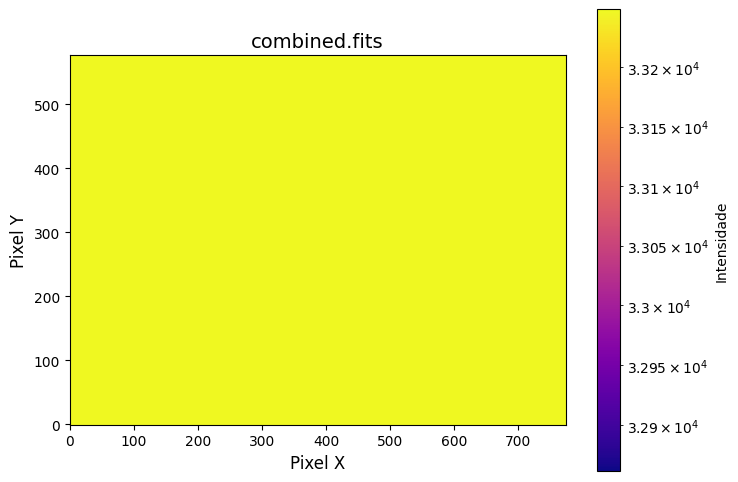

Imagem combinada salva em: ./fits/combined.fits


In [215]:
#EMPILHAR EM UMA BANDA

# Caminhos dos arquivos FITS
file1 = './fits/shifted_flat-divided-bias-subtracted-dark_ngc2070_02_v.fits'
file2 = './fits/flat-divided-bias-subtracted-dark_ngc2070_01_v.fits'

# Caminho do diretório para salvar o arquivo combinado
save_dir = './fits/'
combined_file = os.path.join(save_dir, 'combined.fits')

# Carregar imagens FITS com CCDData
ccd1 = CCDData.read(file1, unit=u.adu)
ccd2 = CCDData.read(file2, unit=u.adu)

# Encontrar o tamanho máximo
max_shape = np.maximum(ccd1.shape, ccd2.shape)

# Criar arrays preenchidos com NaN para o tamanho máximo
data1_padded = np.full(max_shape, np.nan)
data2_padded = np.full(max_shape, np.nan)

# Copiar os dados das imagens para as posições apropriadas
data1_padded[:ccd1.shape[0], :ccd1.shape[1]] = ccd1.data
data2_padded[:ccd2.shape[0], :ccd2.shape[1]] = ccd2.data

# Criar CCDData para as imagens preenchidas
ccd1_padded = CCDData(data1_padded, unit=ccd1.unit)
ccd2_padded = CCDData(data2_padded, unit=ccd2.unit)

# Combinar as imagens empilhadas
combined_image = combine([ccd1_padded, ccd2_padded], method='average')

# Salvar imagem combinada
combined_image.write(combined_file, overwrite=True)

# Ajuste o intervalo de visualização para imagens saturadas
vmin_combined, vmax_combined = np.percentile(combined_image.data, (10, 99.8))

# Plotar imagem combinada
plt.figure(figsize=(8, 6))
img_combined = plt.imshow(combined_image.data, cmap='plasma', origin='lower', norm=colors.LogNorm(vmin=vmin, vmax=vmax))
plt.title(f"{os.path.basename(combined_file)}", fontsize=14)
plt.xlabel('Pixel X', fontsize=12)
plt.ylabel('Pixel Y', fontsize=12)
plt.colorbar(label='Intensidade')
plt.show()

# Imprimir o caminho onde o arquivo foi salvo
print(f'Imagem combinada salva em: {combined_file}')

RGB composite image saved to ./fits/rgb_composite.fits


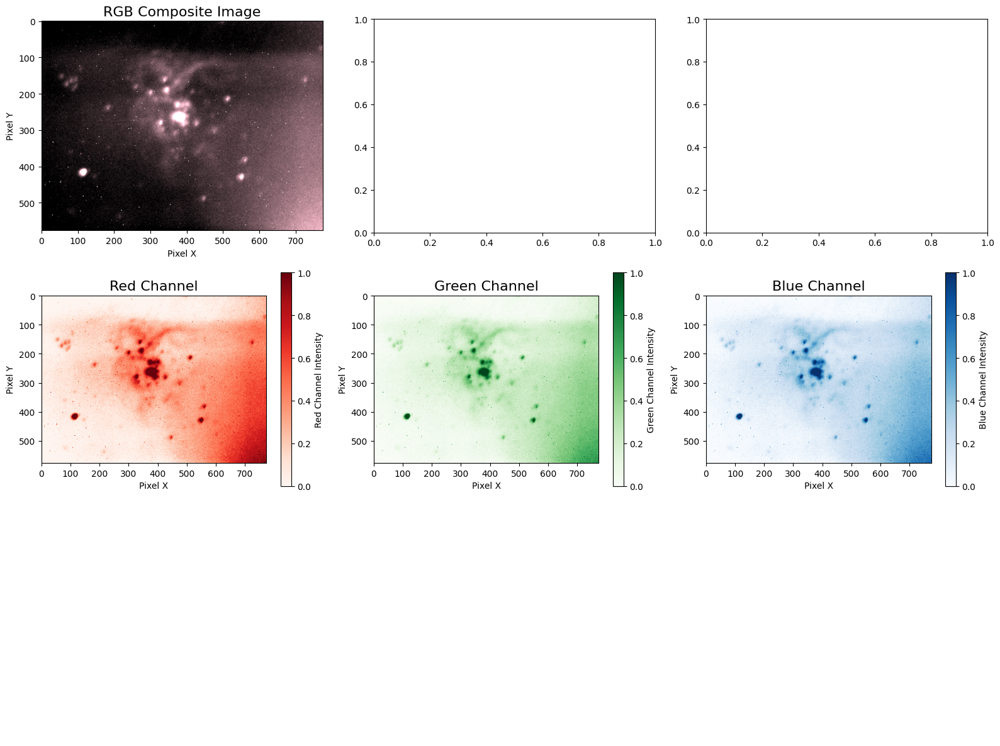

In [216]:
# MANEIRA DE EMPIHLAR RGB COLORIDO

def scale_image(image, low=None, high=None):
    """Scale image data to 0-1 range based on specified low and high values."""
    image = np.where(image > 0, image, 1e-10)  # Avoid log(0) with a small constant
    
    if low is None:
        low = np.percentile(image, 10)  # Use 10th percentile if low is not specified
    if high is None:
        high = np.percentile(image, 99.8)  # Use 99.8th percentile if high is not specified
    
    # Normalize the image between low and high
    scaled_image = (image - low) / (high - low)
    return np.clip(scaled_image, 0, 1)

def adjust_intensity(image, intensity):
    """Adjust the intensity of the image."""
    return np.clip(image * intensity, 0, 1)

# File paths for FITS files
file_paths = {
    'red': './fits/shifted_flat-divided-bias-subtracted-dark_ngc2070_02_v.fits',
    'green': './fits/shifted_flat-divided-bias-subtracted-dark_ngc2070_02_v.fits',
    'blue': './fits/shifted_flat-divided-bias-subtracted-dark_ngc2070_02_v.fits'
}

# Intensity scaling for each channel (0 to 1 range)
intensities = {
    'red': 1.6,
    'green': 1.2,
    'blue': 1.3
}

# Specific scaling ranges for each channel
scale_ranges = {
    'red': (None, None),
    'green': (None, None),
    'blue': (None, None)
}

# Read and process each FITS image
images = {}
for color, path in file_paths.items():
    try:
        with fits.open(path) as hdul:
            image_data = CCDData(hdul[0].data, meta=hdul[0].header, unit='adu').data

        # Get specific range for the channel
        low, high = scale_ranges[color]
        
        # Normalize the image
        scaled_image = scale_image(image_data, low=low, high=high)
        # Adjust the intensity
        adjusted_image = adjust_intensity(scaled_image, intensities[color])
        images[color] = adjusted_image
    except Exception as e:
        print(f"Error processing {color} channel: {e}")

# Ensure all images have the same shape
image_shape = images['red'].shape
for color in images:
    if images[color].shape != image_shape:
        raise ValueError(f"Image shape mismatch for {color} channel.")

# Create RGB image
rgb_img = np.zeros((image_shape[0], image_shape[1], 3), dtype=float)
rgb_img[:,:,0] = images['red']   # Red channel
rgb_img[:,:,1] = images['green'] # Green channel
rgb_img[:,:,2] = images['blue']  # Blue channel

# Normalize final RGB image to ensure values are between 0 and 1
rgb_img = np.clip(rgb_img, 0, 1)

# Save RGB composite image to FITS
rgb_fits = fits.PrimaryHDU(rgb_img)
rgb_hdul = fits.HDUList([rgb_fits])
rgb_fits_path = './fits/rgb_composite.fits'
rgb_hdul.writeto(rgb_fits_path, overwrite=True)
print(f"RGB composite image saved to {rgb_fits_path}")

# Plot the RGB image and individual channel images with colorbars
fig, ax = plt.subplots(3, 3, figsize=(16, 12))  # 3x3 grid for RGB image and 3 channels

# Plot RGB composite image
im_rgb = ax[0, 0].imshow(rgb_img, aspect='equal')
ax[0, 0].set_title('RGB Composite Image', fontsize=16)
ax[0, 0].set_xlabel('Pixel X')
ax[0, 0].set_ylabel('Pixel Y')
ax[0, 0].grid(False)  # Remove grid

# Plot individual color channels
channels = ['red', 'green', 'blue']
cmap_dict = {'red': 'Reds', 'green': 'Greens', 'blue': 'Blues'}
for i, color in enumerate(channels):
    im = ax[1, i].imshow(images[color], cmap=cmap_dict[color], aspect='equal')
    ax[1, i].set_title(f'{color.capitalize()} Channel', fontsize=16)
    ax[1, i].set_xlabel('Pixel X')
    ax[1, i].set_ylabel('Pixel Y')
    ax[1, i].grid(False)  # Remove grid

    # Add colorbar for each channel
    cbar = plt.colorbar(im, ax=ax[1, i], orientation='vertical')
    cbar.set_label(f'{color.capitalize()} Channel Intensity')

# Plot additional empty subplots for layout
for i in range(2, 3):
    for j in range(3):
        ax[i, j].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()